# Video Key-frames Extraction Model

Import `mlmodule` modules

In [1]:
from mlmodule.torch.datasets import (
    LocalBinaryFilesDataset,
)
from mlmodule.models.keyframes.pretrained import torch_keyframes_resnet_imagenet
from mlmodule.models.keyframes.datasets import (
    BinaryVideoCapture,
    extract_video_frames,
)
from mlmodule.callbacks.memory import CollectVideoFramesInMemory
from mlmodule.torch.options import TorchRunnerOptions
from mlmodule.torch.runners import TorchInferenceRunner

import torch
import os

/home/lebret/projects/mlmodule/venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Load a test video

In [2]:
dataset = LocalBinaryFilesDataset(
    [os.path.join("../../tests", "fixtures", "video", "test.mp4")]
)


Extract key-frames with `torch_keyframes_resnet_imagenet`

In [3]:
torch_device = torch.device("cpu")
# define model for keyframes extractor
model = torch_keyframes_resnet_imagenet("resnet18", device=torch_device)

features = CollectVideoFramesInMemory()
runner = TorchInferenceRunner(
    model=model,
    dataset=dataset,
    callbacks=[features],
    options=TorchRunnerOptions(
        device=torch_device,
        data_loader_options={"batch_size": 1},
        tqdm_enabled=True
    ),
)
runner.run()

100%|██████████| 1/1 [00:31<00:00, 31.57s/it]


Visualise the extracted key-frames

First install `ipyplot`

In [ ]:
# Install a pip package in the current Jupyter kernel
import sys
!{sys.executable} -m pip install ipyplot

Then extract the selected key-frames from the video

In [5]:
with open(os.path.join("../../tests", "fixtures", "video", "test.mp4"), mode='rb') as video_file:
    with BinaryVideoCapture(video_file) as capture:
        video_frames = dict(extract_video_frames(capture))
frame_positions = sorted(kf for kf in features.frames[0].frame_indices)
selected_frames = [video_frames[i] for i in frame_positions]

Finally, display the frames

/home/lebret/projects/mlmodule/venv/lib/python3.8/site-packages/ipyplot/_utils.py:95: FutureWarning: The input object of type 'Image' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Image', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  return np.asarray(seq, dtype=type(seq[0]))



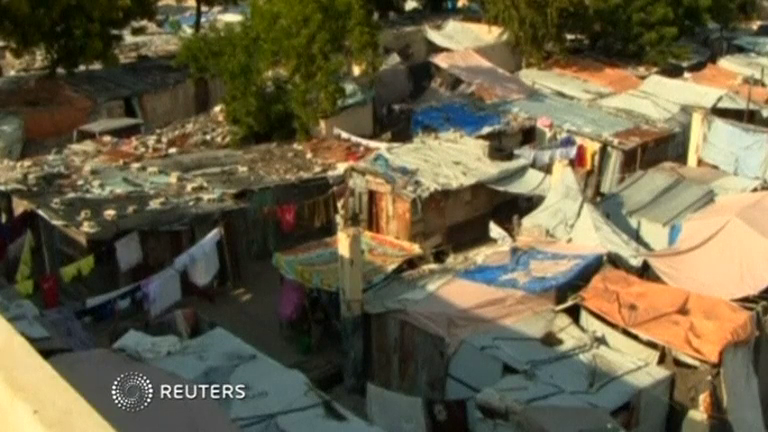
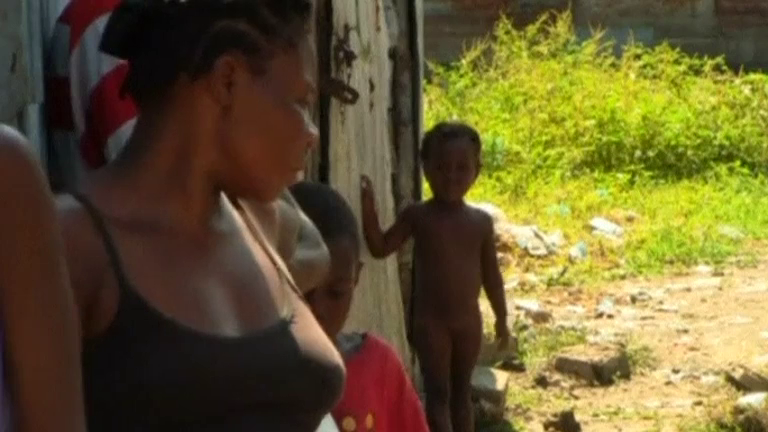
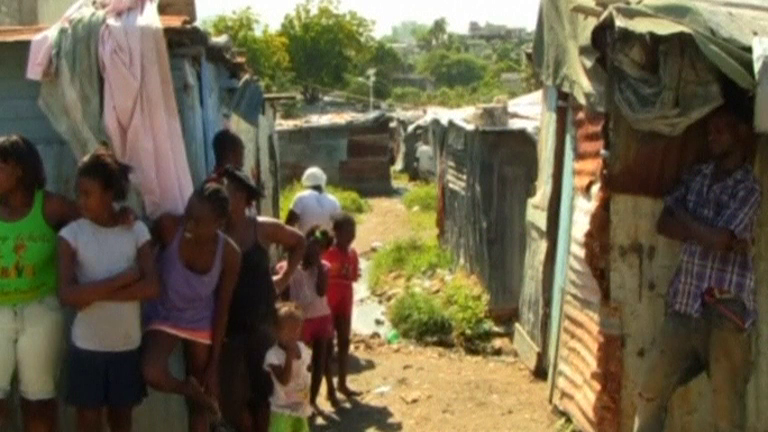
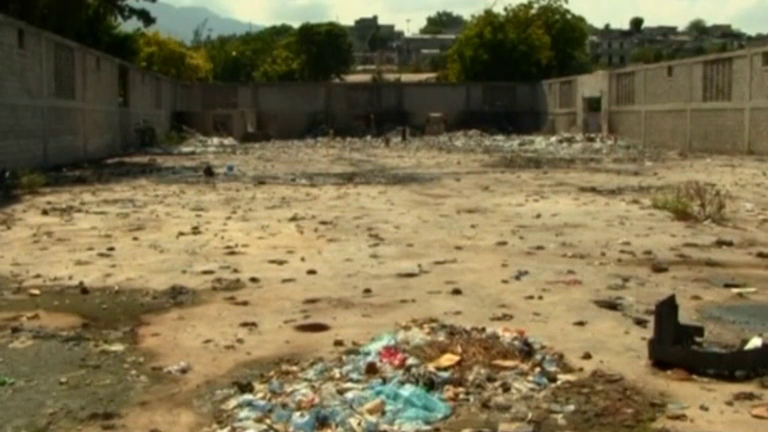
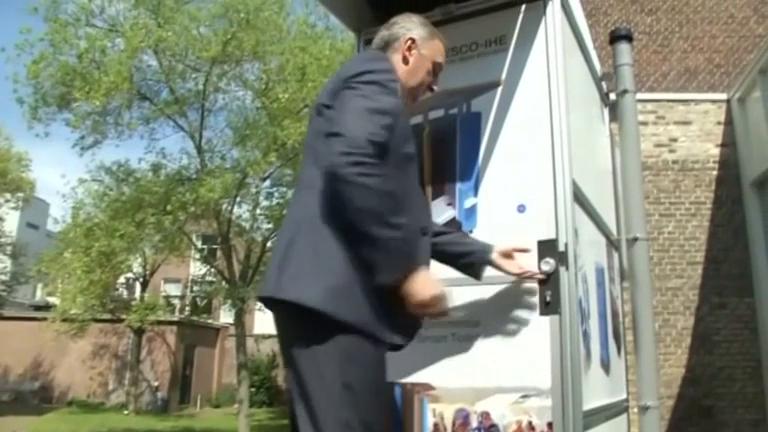
...
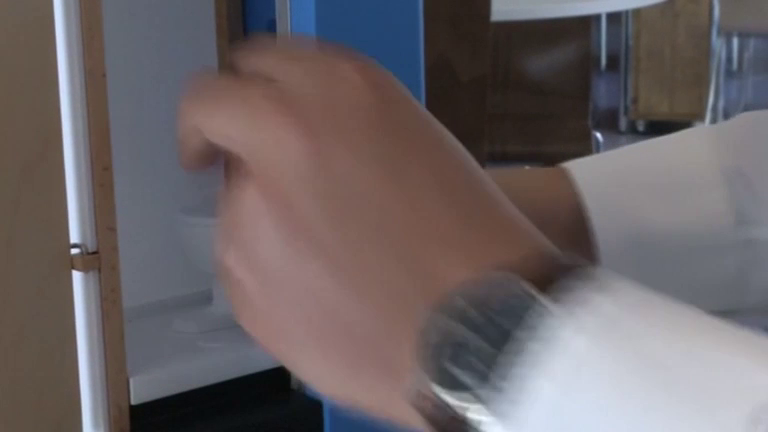
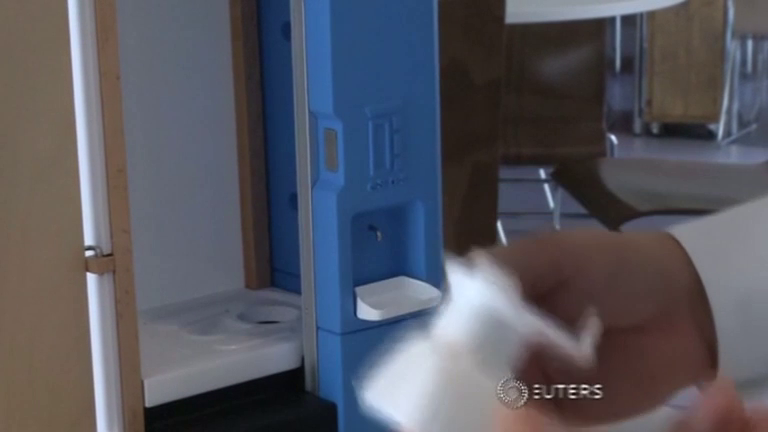
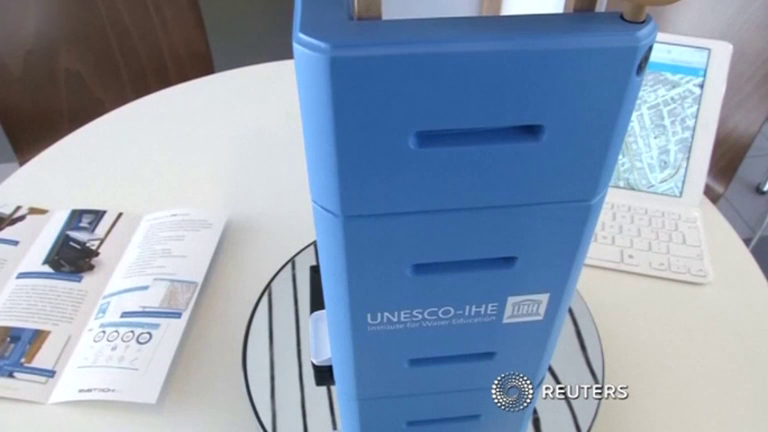
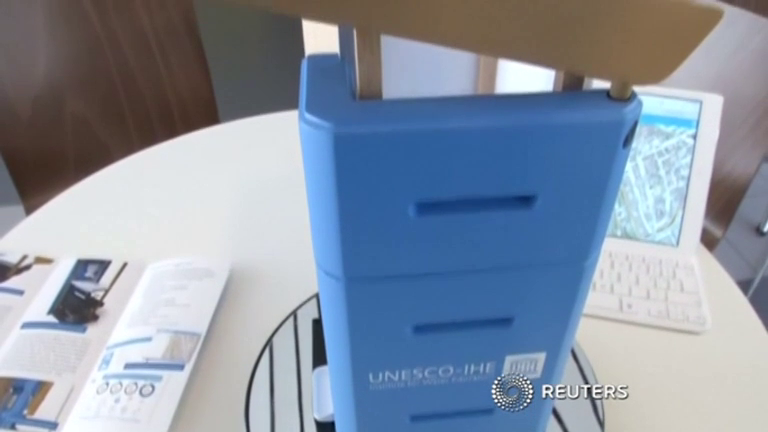
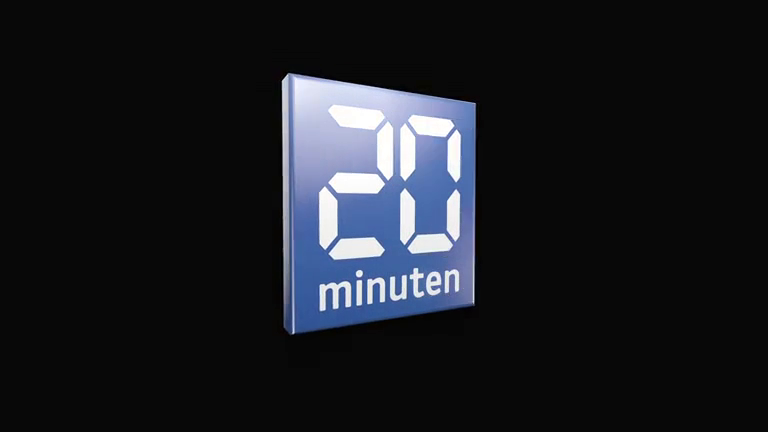

In [9]:
import ipyplot

ipyplot.plot_images(selected_frames, frame_positions, img_width=250)
